   Author: Ankit Kariryaa, University of Bremen

In [1]:
import numpy as np               # numerical array manipulation
import pandas as pd
import os
import time
from collections import defaultdict
from functools import reduce
from PIL import Image
import rasterio                  # I/O raster data (netcdf, height, geotiff, ...)
import rasterio.warp             # Reproject raster samples
from shapely.geometry import Point, Polygon
from shapely.geometry import mapping, shape
import fiona
import cv2
from tqdm import tqdm

from tensorflow.keras.models import load_model

from core.UNet import UNet
from core.losses import tversky, accuracy, dice_coef, dice_loss, specificity, sensitivity
from core.optimizers import adaDelta, adagrad, adam, nadam
from core.frame_info import FrameInfo
from core.dataset_generator import DataGenerator
from core.split_frames import split_dataset
from core.visualize import display_images

%matplotlib inline
import matplotlib.pyplot as plt  # plotting tools
import matplotlib.patches as patches

import warnings                  # ignore annoying warnings
warnings.filterwarnings("ignore")
import logging
logger = logging.getLogger()
logger.setLevel(logging.CRITICAL)

%reload_ext autoreload
%autoreload 2
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

import tensorflow as tf
print(tf.__version__)

/home/ubuntu/anaconda3/envs/trees/lib/python3.7/site-packages/keras/optimizers/optimizer_v2/adadelta.py:77: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adadelta, self).__init__(name, **kwargs)
/home/ubuntu/anaconda3/envs/trees/lib/python3.7/site-packages/keras/optimizers/optimizer_v2/adam.py:110: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)
/home/ubuntu/anaconda3/envs/trees/lib/python3.7/site-packages/keras/optimizers/optimizer_v2/nadam.py:78: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Nadam, self).__init__(name, **kwargs)
/home/ubuntu/anaconda3/envs/trees/lib/python3.7/site-packages/keras/optimizers/optimizer_v2/adagrad.py:77: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adagrad, self).__init__(name, **kwargs)


2.9.1


In [2]:
# Initialize the data related variables used in the notebook

# For reading the ndvi, pan and annotated images generated in the step - 1
base_dir = '/home/ubuntu/data/outdata/preprocessing_output'
image_type = '.png'
ndvi_fn = 'ndvi'
pan_fn = 'pan'
annotation_fn = 'annotation'
weight_fn = 'boundary'

# For testing, images are divided into sequential patches
patch_generation_stratergy = 'sequential'
patch_size = (256,256,4)
BATCH_SIZE = 8 # Model is evaluated in batches; See https://keras.io/models/model/#evaluate

# # When stratergy == sequential
step_size = (256,256)


# The data has four channels
# The order is [NDVI, PAN, ANNOTATION, WEIGHT]
input_shape = (256,256,2)
input_image_channel = [0,1]
input_label_channel = [2]
input_weight_channel = [3]

OPTIMIZER = adaDelta 
LOSS = tversky

#Only for the name of the model in the very end
OPTIMIZER_NAME = 'adaDelta'
LOSS_NAME = 'weightmap_tversky'

modelToEvaluate ='/home/ubuntu/data/trained_model/trees_20220831-0447_AdaDelta_weightmap_tversky_012_256.h5'

In [3]:
#File path for final report 
timestr = time.strftime("%Y%m%d-%H%M")
chf = input_image_channel + input_label_channel
chs = reduce(lambda a,b: a+str(b), chf, '')

evaluation_report_path = model_path = './'
if not os.path.exists(evaluation_report_path):
    os.makedirs(evaluation_report_path)
evaluation_report_filename = os.path.join(evaluation_report_path,'evaluation_per_pixel{}_{}.csv'.format(timestr,chs))


In [4]:
# Read all images/frames into memory
frames = []

all_files = os.listdir(base_dir)
all_files_ndvi = [fn for fn in all_files if fn.startswith(ndvi_fn) and fn.endswith(image_type)]
len(all_files_ndvi)
#dtype = {'F': np.float32, 'L': np.uint8}[pil_img.mode]
for i, fn in enumerate(all_files_ndvi):
    ndvi_img = rasterio.open(os.path.join(base_dir, fn))
    pan_img = rasterio.open(os.path.join(base_dir, fn.replace(ndvi_fn,pan_fn)))
    read_ndvi_img = ndvi_img.read()
    read_pan_img = pan_img.read()
    comb_img = np.concatenate((read_ndvi_img, read_pan_img), axis=0)
    comb_img = np.transpose(comb_img, axes=(1,2,0)) #Channel at the end
    annotation_im = Image.open(os.path.join(base_dir, fn.replace(ndvi_fn,annotation_fn)))
    annotation = np.array(annotation_im)
    weight_im = Image.open(os.path.join(base_dir, fn.replace(ndvi_fn,weight_fn)))
    weight = np.array(weight_im)
    f = FrameInfo(comb_img, annotation, weight)
    frames.append(f)

3

In [5]:
# For testing on all frames. All sequential frames are kept in memory and this may create memory related errors in some cases. 
testing_frames  = list(range(len(frames)))

annotation_channels = input_label_channel + input_weight_channel
test_generator = DataGenerator(input_image_channel, patch_size, testing_frames, frames, annotation_channels)

# Sequential generate all patches from the all frames
test_patches = test_generator.all_sequential_patches(step_size)
print('Total patches to evaluate the model on: ' + str(len(test_patches[0])))

Total patches to evaluate the model on: 48


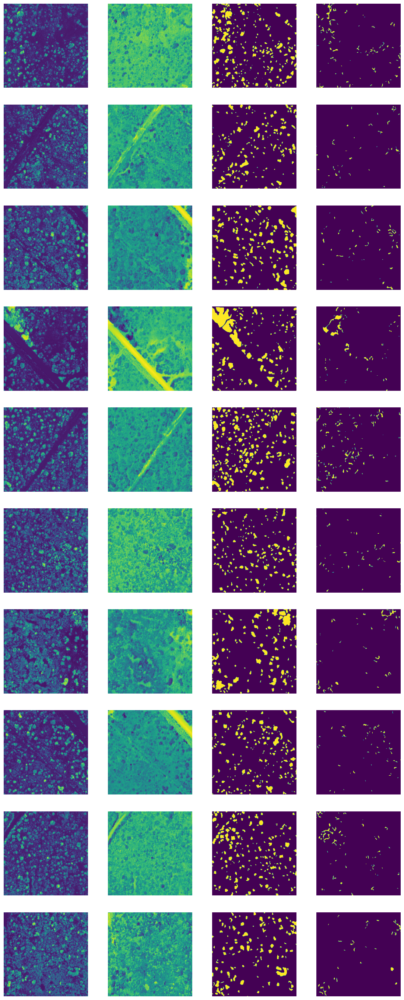

In [6]:
#Display the some of the test images
numberOfImagesToDisplay = 10

train_images, real_label = test_patches[0][:numberOfImagesToDisplay], test_patches[1][:numberOfImagesToDisplay]
display_images(np.concatenate((train_images,real_label), axis = -1))

In [7]:
#Evaluate model
def evaluate_model(model_path, evaluation_report_filename):
    print(model_path, evaluation_report_filename)
    model = load_model(model_path, custom_objects={'tversky': tversky, 'dice_coef': dice_coef, 'dice_loss':dice_loss, 'accuracy':accuracy , 'specificity': specificity, 'sensitivity':sensitivity}, compile=False)
    model.compile(optimizer=OPTIMIZER, loss=LOSS, metrics=[dice_coef, dice_loss, accuracy, specificity, sensitivity])
    print('Evaluating model now!')
    ev = model.evaluate(x=test_patches[0], y=test_patches[1],  verbose=1, use_multiprocessing=True)
    report  = dict(zip(model.metrics_names, ev))
    report['model_path'] =  model_path
    report['test_frame_dir']= base_dir
    report['total_patch_count']= len(test_patches[0])
    return report

report = evaluate_model(modelToEvaluate, evaluation_report_filename)

/home/ubuntu/data/trained_model/trees_20220831-0447_AdaDelta_weightmap_tversky_012_256.h5 ./evaluation_per_pixel20220902-0348_012.csv


2022-09-02 03:49:09.180751: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-09-02 03:49:09.413024: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-09-02 03:49:09.413345: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-09-02 03:49:09.416299: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags

Evaluating model now!


2022-09-02 03:49:22.236199: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8400


2/2 [==============================] - 13s 1s/step - loss: 0.2565 - dice_coef: 0.9646 - dice_loss: 0.0354 - accuracy: 0.9695 - specificity: 0.9829 - sensitivity: 0.7847


1/1 [==============================] - 0s 24ms/step


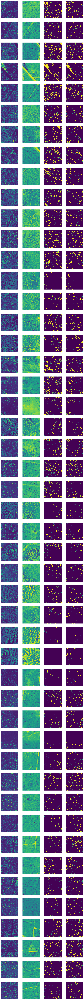

In [8]:
# Show the model predictions!
model = load_model(modelToEvaluate, custom_objects={'tversky': tversky, 'dice_coef': dice_coef, 'dice_loss':dice_loss, 'accuracy':accuracy , 'specificity': specificity, 'sensitivity':sensitivity}, compile=False)
model.compile(optimizer=OPTIMIZER, loss=LOSS, metrics=[dice_coef, dice_loss, accuracy, specificity, sensitivity])
predictions = []
for tp in test_patches[0]:
    tpx = np.expand_dims(tp, axis=0)
    modelpredtictions = model.predict(tpx, batch_size=BATCH_SIZE)
    predictions.append(np.squeeze(modelpredtictions, axis = 0))

display_images(np.concatenate((test_patches[0], test_patches[1][...,[0]], predictions), axis = -1))

In [9]:
# Transform Contours from image to world coordinates  
def transform_contours_to_xy(contours, transform):
    tp = []
    for cnt in contours:
        pl = cnt[:, 0, :]
        cols, rows = zip(*pl)
        x,y = rasterio.transform.xy(transform, rows, cols)
        tl = [list(i) for i in zip(x, y)]
        tp.append(tl)
    return (tp)

def mask_to_polygons(mask, transform, th = 0.5):
    # first, find contours with cv2: it's much faster than shapely and returns hierarchy
    mask[mask < th] = 0
    mask[mask >= th] = 1
    mask = ((mask) * 255).astype(np.uint8)
    contours, hierarchy = cv2.findContours(mask, cv2.RETR_CCOMP, cv2.CHAIN_APPROX_SIMPLE)
    
    #Convert contours from image coordinate to xy coordinate (world coordinates)
    contours = transform_contours_to_xy(contours, transform)

    if not contours: #TODO: Raise an error maybe
        print('Warning: No contours/polygons detected!!')
        return [Polygon()]#[Polygon()]
    
    # now messy stuff to associate parent and child contours
    cnt_children = defaultdict(list)
    child_contours = set()
    assert hierarchy.shape[0] == 1
    # http://docs.opencv.org/3.1.0/d9/d8b/tutorial_py_contours_hierarchy.html
    for idx, (_, _, _, parent_idx) in enumerate(hierarchy[0]):
        if parent_idx != -1:
            child_contours.add(idx)
            cnt_children[parent_idx].append(contours[idx])
    # create actual polygons filtering by area/hole (removes artifacts)
    all_polygons = []
    for idx, cnt in enumerate(contours):
        if idx not in child_contours: #and cv2.contourArea(cnt) >= min_area: #Do we need to check for min_area??
            try:
                poly = Polygon(
                    shell=cnt,
                    holes=[c for c in cnt_children.get(idx, [])])
                           #if cv2.contourArea(c) >= min_area]) #Do we need to check for min_area??
                all_polygons.append(poly)
            except Exception as e: 
#                 print(e)
                pass
#     print(len(all_polygons))
    return(all_polygons)

In [13]:
import pyproj    
import shapely
import shapely.ops as ops

def transform_to_meter_coordinate_system(geom):
    # TODO: Remove the hard coded values
    project = pyproj.Transformer.from_proj(
        pyproj.Proj(init='epsg:26913'), # source coordinate system
        pyproj.Proj(init='epsg:26913')) # destination coordinate system
    gt = ops.transform(project.transform, geom)  # apply projection
    return gt

def ha_area(ha_polygons):
    ts = 0
    ha_polygons_meter = [transform_to_meter_coordinate_system(p) for p in ha_polygons]
    for p in ha_polygons_meter:
        ts += p.area
    return ts

def ha_area_from_mask(mask, th = 0.5):
    mask[mask < th] = 0
    mask[mask >= th] = 1
#     totalMaskArea = 256*256/4
    canopyArea = mask.sum()/4 # Divide by 4, since we use a resolution of 50cm/pixel
    return canopyArea

# TODO: Remove the need for the a tiff file for transformation
with rasterio.open('/home/ubuntu/data/indata/m_3210310_ne_13_060_20200522.tif') as raster_image:
#     print(raster_image.meta)
    transform = raster_image.meta['transform']
print(transform)

ha_prediction_polygons = []
ha_label_polygons = []
    
ha_prediction_canopy_area = []
ha_label_canopy_area = []

for em, pred in enumerate(predictions):
    ap = mask_to_polygons(pred, transform )
    ha_prediction_polygons.append(ap)
    ha_prediction_canopy_area.append(ha_area_from_mask(pred))

for lb in test_patches[1][...,[0]]:
    ap = mask_to_polygons(lb, transform)
    ha_label_polygons.append(ap)
    ha_label_canopy_area.append(ha_area_from_mask(lb))

| 0.60, 0.00, 610890.00|
| 0.00,-0.60, 3638322.00|
| 0.00, 0.00, 1.00|


In [14]:
ha_prediction_polygons_count = [len(hp) for hp in ha_prediction_polygons]
ha_label_polygons_count = [len(hp) for hp in ha_label_polygons]

#Alternate method to calcualte canopy area as a sum of area of trees
# print('To calculate the area we convert the polygons to a coordinate system where unit is meters. This process is time consuming.')
# ha_prediction_canopy_area = list(map(ha_area, ha_prediction_polygons))
# ha_label_canopy_area = list(map(ha_area, ha_label_polygons))

In [15]:
from scipy.stats import pearsonr
print(len(ha_prediction_polygons_count))
ha_count_correlation = pearsonr(ha_prediction_polygons_count, ha_label_polygons_count)
ha_area_correlation = pearsonr(ha_prediction_canopy_area, ha_label_canopy_area)

print('Count correlation:' + str(ha_count_correlation))
print('Area correlation:' + str(ha_area_correlation))

48
Count correlation:(0.7531138634995109, 6.602937057641345e-10)
Area correlation:(0.7640352491957421, 2.6546120769371896e-10)


In [16]:
# Generate the final report

report['count_correlation'] =  ha_count_correlation[0]
report['count_correlation_tvalue'] =  ha_count_correlation[1]
report['area_correlation'] = ha_area_correlation[0]
report['area_correlation_tvalue'] =  ha_area_correlation[1]

print(report)

tdf = pd.DataFrame(report, index=[0])    
# print(tdf.columns)
col_beginning = ['model_path','test_frame_dir', 'total_patch_count', 'accuracy', 'sensitivity']
col_rest = [x for x in tdf.columns.tolist() if x not in col_beginning]
cols = col_beginning + col_rest
tdf = tdf[cols]
tdf.to_csv(evaluation_report_filename)

{'loss': 0.25648626685142517, 'dice_coef': 0.9645905494689941, 'dice_loss': 0.03540956228971481, 'accuracy': 0.9694846272468567, 'specificity': 0.9828530550003052, 'sensitivity': 0.7846532464027405, 'model_path': '/home/ubuntu/data/trained_model/trees_20220831-0447_AdaDelta_weightmap_tversky_012_256.h5', 'test_frame_dir': '/home/ubuntu/data/outdata/preprocessing_output', 'total_patch_count': 48, 'count_correlation': 0.7531138634995109, 'count_correlation_tvalue': 6.602937057641345e-10, 'area_correlation': 0.7640352491957421, 'area_correlation_tvalue': 2.6546120769371896e-10}


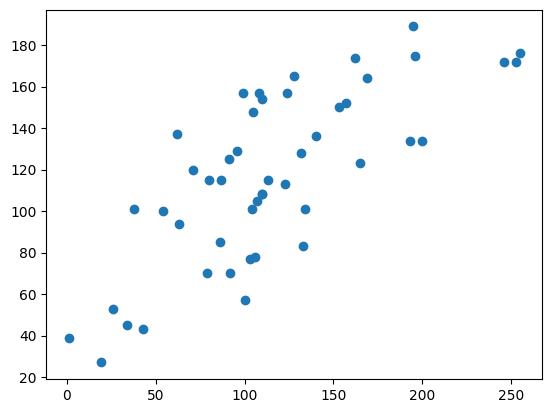

In [17]:
plt.scatter(ha_label_polygons_count,ha_prediction_polygons_count)

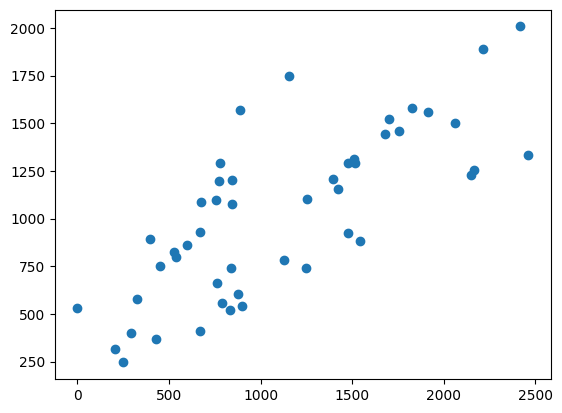

In [18]:
plt.scatter(ha_label_canopy_area, ha_prediction_canopy_area)